<a href="https://colab.research.google.com/github/rajarsheya/Advanced_AI_Transformers_for_Computer_Vision/blob/main/Advanced_AI_Transformers_for_Computer_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/18lcAtxvFn51-newA-r3ZW1wcimq3PsOT?usp=sharing)

# Advanced AI: Transformers for Computer Vision

## Getting the data

In [1]:
!wget https://github.com/jonfernandes/flowers-dataset/raw/main/flower_photos.tgz
!tar -xvf flower_photos.tgz


--2025-04-19 08:03:42--  https://github.com/jonfernandes/flowers-dataset/raw/main/flower_photos.tgz
Resolving github.com (github.com)... 140.82.116.4
Connecting to github.com (github.com)|140.82.116.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/jonfernandes/flowers-dataset/main/flower_photos.tgz [following]
--2025-04-19 08:03:43--  https://media.githubusercontent.com/media/jonfernandes/flowers-dataset/main/flower_photos.tgz
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 228813984 (218M) [application/octet-stream]
Saving to: ‘flower_photos.tgz’

flower_photos.tgz   100%[===================>] 218.21M   117MB/s    in 1.9s    

2025-04-19 08:03:52 (117 MB/s) - ‘flower_photos.tg

## Using datasets

In [ ]:
# 28-Jan 2025 Updated these because of breaking changes. fsspec==2023.9.2 huggingface_hub==0.23.0 gradio==3.45.0
!pip install transformers==4.24.0 datasets==2.7.1 evaluate==0.3.0 gradio==3.45.0 huggingface_hub==0.23.0 fsspec==2023.9.2

In [ ]:
from datasets import load_dataset

ds = load_dataset('imagefolder', data_files='https://github.com/jonfernandes/flowers-dataset/raw/main/flower_photos.tgz')
ds

  0%|          | 0/1 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3670
    })
})

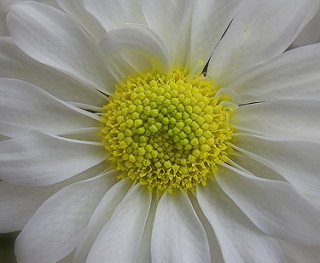

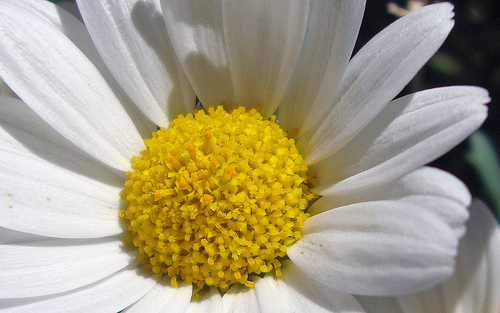

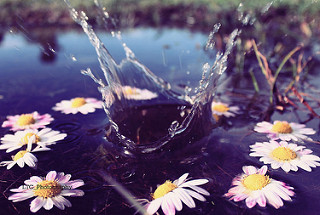

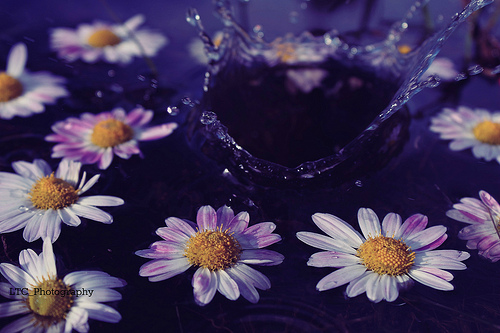

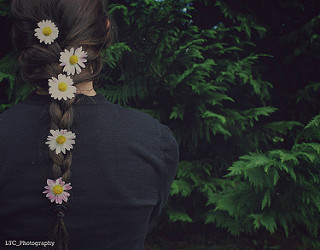

In [ ]:
for i in range(5):
  display(ds['train'][i]['image'])

In [ ]:
labels = ds['train'].features['label'].names
labels

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [ ]:
ds_train_validation = ds['train'].train_test_split(test_size=0.1, seed=1, shuffle=True)
ds_train_validation

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [ ]:
ds_train_validation['validation'] = ds_train_validation.pop('test')
ds_train_validation

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [ ]:
ds.update(ds_train_validation)
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3303
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
})

In [ ]:
ds_train_test = ds['train'].train_test_split(test_size=0.1, seed=1, shuffle=True)
ds_train_test

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 2972
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 331
    })
})

In [ ]:
ds.update(ds_train_test)
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 2972
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 367
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 331
    })
})

## Using a pre-trained model without fine-tuning

In [ ]:
from transformers import AutoModelForImageClassification, AutoFeatureExtractor
import torch
model_id = 'google/vit-base-patch16-224'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
model.eval()


/usr/local/lib/python3.11/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=7

In [ ]:
feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
feature_extractor

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

ViTFeatureExtractor {
  "do_normalize": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "size": 224
}

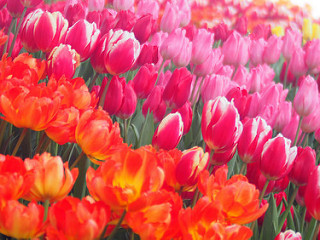

In [ ]:
train_image_id = 3
one_image = ds['train'][train_image_id]['image']
one_image

In [ ]:
inp = feature_extractor(images=one_image, return_tensors='pt')
inp

{'pixel_values': tensor([[[[ 0.8039,  0.8353,  0.8118,  ...,  0.9922,  1.0000,  1.0000],
          [ 0.7882,  0.6941,  0.6078,  ...,  1.0000,  1.0000,  1.0000],
          [ 0.7098,  0.5686,  0.6235,  ...,  1.0000,  1.0000,  1.0000],
          ...,
          [-0.6941, -0.7176, -0.7490,  ..., -0.2941, -0.1686,  0.2000],
          [-0.6471, -0.7569, -0.8039,  ..., -0.3804, -0.2078,  0.1843],
          [-0.6000, -0.6941, -0.8039,  ..., -0.4510, -0.2549,  0.1686]],

         [[-0.6000, -0.7098, -0.7804,  ...,  0.9922,  1.0000,  1.0000],
          [-0.7255, -0.7412, -0.7961,  ...,  1.0000,  1.0000,  1.0000],
          [-0.7569, -0.7804, -0.8118,  ...,  1.0000,  1.0000,  1.0000],
          ...,
          [-0.7255, -0.7490, -0.8118,  ..., -0.5373, -0.7961, -0.9608],
          [-0.6941, -0.7255, -0.7882,  ..., -0.5765, -0.8196, -0.9529],
          [-0.6235, -0.7176, -0.7804,  ..., -0.6000, -0.8431, -0.9686]],

         [[-0.0745, -0.1765, -0.2157,  ...,  0.9922,  1.0000,  1.0000],
          [-0

In [ ]:
#This will not work if you are using a GPU
outp = model(**inp)
outp

RuntimeError: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor

In [ ]:
inp = feature_extractor(images=one_image, return_tensors='pt').to(device)
outp = model(**inp)
outp

ImageClassifierOutput(loss=None, logits=tensor([[-2.6465e-01,  2.4560e-01, -9.3033e-01, -9.0162e-02, -7.2027e-01,
         -6.9271e-01, -2.9413e-01, -1.9738e-02, -3.9560e-01, -1.5814e+00,
          6.9377e-01, -1.0876e+00, -1.6026e+00, -7.1225e-01, -8.6418e-01,
         -9.7725e-02, -1.2808e-01, -7.6168e-01,  1.7151e-03, -1.7973e+00,
         -7.6865e-01, -3.9841e-01, -1.3043e+00, -8.4577e-01, -2.6171e-01,
         -1.0951e+00, -7.4435e-01, -1.4295e+00, -1.1153e+00, -6.6912e-01,
         -1.1013e+00, -1.2263e+00, -9.7092e-01, -1.1745e+00, -6.0647e-01,
         -9.0994e-01,  1.6873e-02, -1.5615e-01, -8.8855e-01, -6.4097e-01,
         -1.4468e-01, -5.5449e-01, -7.7151e-01, -4.0527e-01,  1.2411e-02,
         -8.4242e-01, -1.1913e+00, -5.2829e-01, -1.3650e+00, -8.8367e-01,
         -1.1699e+00, -2.0226e-01, -7.4786e-01, -1.3463e+00, -1.2216e+00,
         -1.3798e+00, -1.0736e+00, -7.9586e-01, -1.2307e+00, -9.0284e-01,
          2.6091e-01, -1.3658e-01, -9.5352e-01, -7.7037e-01, -7.8705e-01

In [ ]:
outp.logits.shape

torch.Size([1, 1000])

In [ ]:
torch.argmax(outp.logits, dim=1)

tensor([738], device='cuda:0')

In [ ]:
pred = torch.argmax(outp.logits, dim=1).item()
pred

738

In [ ]:
model.config

ViTConfig {
  "_name_or_path": "google/vit-base-patch16-224",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "tench, Tinca tinca",
    "1": "goldfish, Carassius auratus",
    "2": "great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias",
    "3": "tiger shark, Galeocerdo cuvieri",
    "4": "hammerhead, hammerhead shark",
    "5": "electric ray, crampfish, numbfish, torpedo",
    "6": "stingray",
    "7": "cock",
    "8": "hen",
    "9": "ostrich, Struthio camelus",
    "10": "brambling, Fringilla montifringilla",
    "11": "goldfinch, Carduelis carduelis",
    "12": "house finch, linnet, Carpodacus mexicanus",
    "13": "junco, snowbird",
    "14": "indigo bunting, indigo finch, indigo bird, Passerina cyanea",
    "15": "robin, American robin, Turdus migratorius",
    "16": "bulbul",
 

In [ ]:
model.config.id2label[pred]

'pot, flowerpot'

In [ ]:
'daisy' in model.config.label2id

True

## Defining a model

In [ ]:
model_id = 'google/vit-base-patch16-224'

In [ ]:
labels = ds['train'].features['label'].names
labels

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

In [ ]:
id2label = {key: value for key, value in enumerate(labels)}
id2label

{0: 'daisy', 1: 'dandelion', 2: 'roses', 3: 'sunflowers', 4: 'tulips'}

In [ ]:
label2id = {value:key for key, value in enumerate(labels)}
label2id

{'daisy': 0, 'dandelion': 1, 'roses': 2, 'sunflowers': 3, 'tulips': 4}

In [ ]:
model = AutoModelForImageClassification.from_pretrained(model_id,
                                                        num_labels=len(labels),
                                                        id2label=id2label,
                                                        label2id=label2id,
                                                        ignore_mismatched_sizes=True
                                                        )

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## Pre-processing images

In [ ]:
import torchvision

from torchvision.transforms import (
    Compose,
    Normalize,
    RandomHorizontalFlip,
    RandomResizedCrop,
    ToTensor,
    Resize,
    CenterCrop
)

In [ ]:
normalize = Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)

In [ ]:
feature_extractor.size

224

In [ ]:
train_transform = Compose(
    [
     RandomResizedCrop(feature_extractor.size),
     RandomHorizontalFlip(),
     ToTensor(),
     normalize
    ]
)

validation_transform = Compose(
        [
            Resize(feature_extractor.size),
            CenterCrop(feature_extractor.size),
            ToTensor(),
            normalize,
        ]
    )

def train_transform_images(images):
  images["pixel_values"] = [train_transform(image.convert("RGB")) for image in images["image"]]
  return images

def validation_transform_images(images):
  images["pixel_values"] = [validation_transform(image.convert("RGB")) for image in images["image"]]
  return images

In [ ]:
transformed_ds = ds.with_transform(train_transform_images)
transformed_ds['train'] = ds['train'].with_transform(train_transform_images)
transformed_ds['validation'] = ds['validation'].with_transform(validation_transform_images)
transformed_ds['test'] = ds['test'].with_transform(validation_transform_images)

## A transformed image

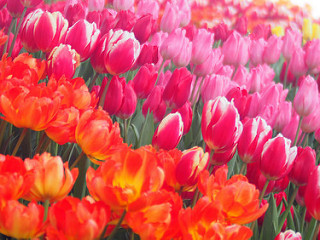

In [ ]:
sample_image = ds['train'][train_image_id]['image']
sample_image

TypeError: Image data of dtype object cannot be converted to float

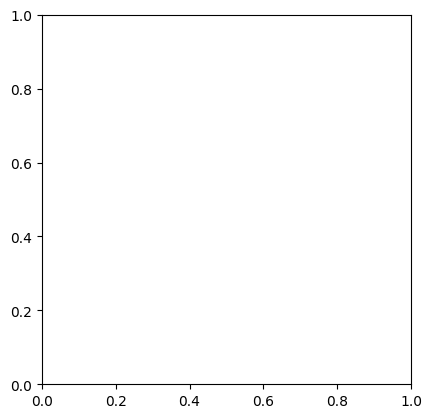

In [ ]:
# Re-run cell multiple times (train_transform)
import matplotlib.pyplot as plt
transformed_sample_image = train_transform(sample_image)
plt.imshow(transformed_sample_image.permute)#(1, 2, 0)


In [ ]:
transformed_sample_image

tensor([[[ 0.9294,  0.9373,  0.9451,  ...,  0.7020,  0.6863,  0.6706],
         [ 0.9294,  0.9294,  0.9373,  ...,  0.6941,  0.6784,  0.6627],
         [ 0.9216,  0.9216,  0.9216,  ...,  0.6784,  0.6627,  0.6471],
         ...,
         [-0.2627, -0.1686, -0.0510,  ...,  0.8431,  0.8431,  0.8510],
         [-0.3333, -0.2157, -0.0667,  ...,  0.8196,  0.8118,  0.8196],
         [-0.3804, -0.2471, -0.0745,  ...,  0.8118,  0.7961,  0.7961]],

        [[ 0.4510,  0.4039,  0.3490,  ..., -0.8510, -0.8431, -0.8431],
         [ 0.4431,  0.3961,  0.3412,  ..., -0.8510, -0.8510, -0.8510],
         [ 0.4275,  0.3804,  0.3255,  ..., -0.8510, -0.8588, -0.8588],
         ...,
         [-0.4824, -0.4588, -0.4196,  ..., -0.9451, -0.9451, -0.9451],
         [-0.5294, -0.4824, -0.4118,  ..., -0.8824, -0.9059, -0.9216],
         [-0.5608, -0.4980, -0.4118,  ..., -0.8353, -0.8745, -0.8980]],

        [[ 0.7804,  0.7569,  0.7176,  ..., -0.3725, -0.3882, -0.3961],
         [ 0.7725,  0.7490,  0.7098,  ..., -0

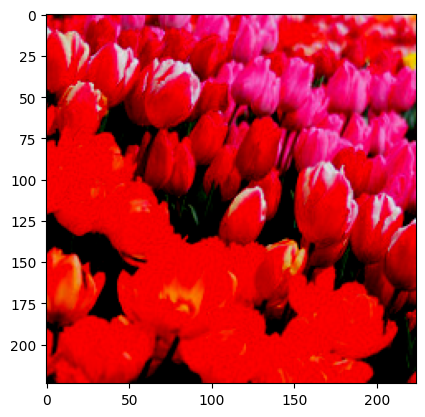

In [ ]:
# Re-run cell multiple times (validation_transform)
import matplotlib.pyplot as plt
transformed_sample_image = validation_transform(sample_image)
plt.imshow(transformed_sample_image.permute(1, 2, 0))

## Getting images in the correct format

**4-images**

In [ ]:
four_images = [transformed_ds['train'][i] for i in range(4)]
four_images

[{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=159x240>,
  'label': 1,
  'pixel_values': tensor([[[-0.4275, -0.4275, -0.4196,  ...,  0.0902,  0.0980,  0.0980],
           [-0.4275, -0.4275, -0.4196,  ...,  0.0745,  0.0980,  0.1137],
           [-0.4196, -0.4196, -0.4196,  ...,  0.0510,  0.1059,  0.1373],
           ...,
           [-0.2941, -0.3020, -0.3176,  ..., -0.5059, -0.4824, -0.4745],
           [-0.2549, -0.2549, -0.2471,  ..., -0.4667, -0.4510, -0.4431],
           [-0.2314, -0.2235, -0.2078,  ..., -0.4431, -0.4353, -0.4275]],
  
          [[-0.1451, -0.1451, -0.1451,  ...,  0.3412,  0.3490,  0.3490],
           [-0.1451, -0.1451, -0.1451,  ...,  0.3255,  0.3490,  0.3569],
           [-0.1451, -0.1451, -0.1451,  ...,  0.3098,  0.3412,  0.3647],
           ...,
           [-0.2627, -0.2863, -0.3255,  ..., -0.4902, -0.4667, -0.4588],
           [-0.2235, -0.2314, -0.2549,  ..., -0.4431, -0.4275, -0.4196],
           [-0.1922, -0.2000, -0.2078,  ..., -0.4118, -

In [ ]:
print(four_images[0]['pixel_values'].shape, four_images[1]['pixel_values'].shape, four_images[2]['pixel_values'].shape, four_images[3]['pixel_values'].shape)

torch.Size([3, 224, 224]) torch.Size([3, 224, 224]) torch.Size([3, 224, 224]) torch.Size([3, 224, 224])


In [ ]:
four_images_labels = [image['label'] for image in four_images]
four_images_labels

[1, 4, 1, 4]

In [ ]:
import torch
four_images_labels = torch.tensor([image['label'] for image in four_images])
four_images_labels

tensor([1, 4, 1, 4])

In [ ]:
#will get an error
four_images_pixel_values = torch.tensor([image['pixel_values'] for image in four_images])
four_images_pixel_values

ValueError: only one element tensors can be converted to Python scalars

In [ ]:
four_images_pixel_values = torch.cat([image['pixel_values'] for image in four_images])
four_images_pixel_values

tensor([[[-0.4275, -0.4275, -0.4196,  ...,  0.0902,  0.0980,  0.0980],
         [-0.4275, -0.4275, -0.4196,  ...,  0.0745,  0.0980,  0.1137],
         [-0.4196, -0.4196, -0.4196,  ...,  0.0510,  0.1059,  0.1373],
         ...,
         [-0.2941, -0.3020, -0.3176,  ..., -0.5059, -0.4824, -0.4745],
         [-0.2549, -0.2549, -0.2471,  ..., -0.4667, -0.4510, -0.4431],
         [-0.2314, -0.2235, -0.2078,  ..., -0.4431, -0.4353, -0.4275]],

        [[-0.1451, -0.1451, -0.1451,  ...,  0.3412,  0.3490,  0.3490],
         [-0.1451, -0.1451, -0.1451,  ...,  0.3255,  0.3490,  0.3569],
         [-0.1451, -0.1451, -0.1451,  ...,  0.3098,  0.3412,  0.3647],
         ...,
         [-0.2627, -0.2863, -0.3255,  ..., -0.4902, -0.4667, -0.4588],
         [-0.2235, -0.2314, -0.2549,  ..., -0.4431, -0.4275, -0.4196],
         [-0.1922, -0.2000, -0.2078,  ..., -0.4118, -0.4039, -0.3961]],

        [[ 0.0588,  0.0667,  0.0745,  ...,  0.5373,  0.5451,  0.5451],
         [ 0.0667,  0.0667,  0.0745,  ...,  0

In [ ]:
four_images_pixel_values.shape

torch.Size([12, 224, 224])

In [ ]:
four_images_pixel_values = torch.stack([image['pixel_values'] for image in four_images])
four_images_pixel_values.shape

torch.Size([4, 3, 224, 224])

In [ ]:
from torch.utils.data import DataLoader

def collate_fn(images):
  labels = torch.tensor([image['label'] for image in images])
  pixel_values = torch.stack([image['pixel_values'] for image in images])
  return {'pixel_values': pixel_values, 'labels': labels}

train_dataloader = DataLoader(transformed_ds['train'], batch_size=4, collate_fn=collate_fn, shuffle=True)
validation_dataloader = DataLoader(transformed_ds['validation'], batch_size=4, collate_fn=collate_fn, shuffle=False)
test_dataloader = DataLoader(transformed_ds['test'], batch_size=4, collate_fn=collate_fn, shuffle=False)

In [ ]:
batch = next(iter(train_dataloader))

for key, value in batch.items():
  print(key, value.shape)

pixel_values torch.Size([4, 3, 224, 224])
labels torch.Size([4])


## Training arguments

In [ ]:
from transformers import TrainingArguments, Trainer

batch_size=32
metric_name = "accuracy"
model_name = 'vit-base-patch16-224-finetuned-flower'

args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=3,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs',
    push_to_hub=True
)

In [ ]:
from huggingface_hub import notebook_login
notebook_login()

In [ ]:
!git config --global credential.helper store

## Model Training

In [ ]:
import os

os.environ["WANDB_DISABLED"] = "true"

args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=1,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs',
)

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=transformed_ds['train'],
    eval_dataset=transformed_ds['validation'],
    tokenizer=feature_extractor,
    data_collator=collate_fn,
)

trainer.train()

using `logging_steps` to initialize `eval_steps` to 500
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).
/usr/local/lib/python3.11/dist-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
***** Running training *****
  Num examples = 2972
  Num Epochs = 1
  Instantaneous batch size per device = 32
  Total train batch size (w. 

Step,Training Loss,Validation Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=93, training_loss=0.1077473855787708, metrics={'train_runtime': 104.9521, 'train_samples_per_second': 28.318, 'train_steps_per_second': 0.886, 'total_flos': 2.303123856192553e+17, 'train_loss': 0.1077473855787708, 'epoch': 1.0})

In [ ]:
trainer.predict(transformed_ds['test'])

***** Running Prediction *****
  Num examples = 331
  Batch size = 32


PredictionOutput(predictions=array([[-2.4655995e+00, -1.8624648e+00, -7.1467899e-02, -1.7648309e+00,
         6.1319103e+00],
       [-6.1576861e-01,  5.3304434e+00, -1.6758717e+00, -8.5848606e-01,
        -1.4304270e+00],
       [-1.1420468e+00, -1.9053342e+00,  4.0770512e-02, -1.7976540e+00,
         4.8576283e+00],
       ...,
       [-1.5868130e+00, -1.3506221e+00,  2.4850152e+00, -1.1906526e+00,
         8.7113196e-01],
       [-1.6006129e+00, -1.7069170e+00,  4.9141197e+00, -1.8537250e+00,
         5.5237915e-03],
       [-1.0641170e+00,  6.9669423e+00, -1.3230456e+00, -1.8936535e+00,
        -1.5627372e+00]], dtype=float32), label_ids=array([4, 1, 4, 1, 0, 1, 4, 1, 3, 3, 3, 3, 4, 0, 2, 0, 3, 1, 4, 2, 0, 4,
       3, 3, 3, 2, 4, 1, 0, 3, 1, 0, 1, 1, 4, 1, 2, 0, 4, 3, 0, 3, 4, 4,
       0, 3, 1, 4, 1, 3, 1, 0, 2, 4, 1, 0, 4, 3, 3, 3, 0, 1, 4, 0, 1, 4,
       2, 4, 2, 0, 3, 0, 4, 1, 3, 3, 4, 3, 4, 3, 3, 1, 0, 2, 4, 3, 4, 1,
       4, 0, 1, 4, 0, 0, 1, 1, 0, 1, 0, 4, 2, 4, 4, 4, 0, 

From the [evaluate documentation](https://huggingface.co/docs/evaluate/a_quick_tour#compute):

```
metric.compute(
          references=...,
          predictions=...)
```

In [ ]:
import evaluate
import numpy as np

metric = evaluate.load('accuracy')

def compute_metrics(batch):
  return metric.compute(
      references=batch.label_ids,
      predictions=np.argmax(batch.predictions, axis=1))

In [ ]:
args = TrainingArguments(
    model_name,
    evaluation_strategy="steps",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=5,
    load_best_model_at_end=True,
    metric_for_best_model=metric_name,
    remove_unused_columns=False,
    logging_dir='./logs',
#    push_to_hub=True  25-Jan-2025 Uploading this to Huggingface breaks the code, so commented out for now. You still have the trained model in Colab.
)

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=transformed_ds['train'],
    eval_dataset=transformed_ds['validation'],
    tokenizer=feature_extractor,
    data_collator=collate_fn,
    compute_metrics=compute_metrics
)

using `logging_steps` to initialize `eval_steps` to 500
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/

<IPython.core.display.Javascript object>

In [ ]:
trainer.train()
trainer.save_model()

/usr/local/lib/python3.11/dist-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
***** Running training *****
  Num examples = 2972
  Num Epochs = 5
  Instantaneous batch size per device = 32
  Total train batch size (w. parallel, distributed & accumulation) = 32
  Gradient Accumulation steps = 1
  Total optimization steps = 465
  Number of trainable parameters = 85802501


Step,Training Loss,Validation Loss




Training completed. Do not forget to share your model on huggingface.co/models =)


Saving model checkpoint to vit-base-patch16-224-finetuned-flower
Configuration saved in vit-base-patch16-224-finetuned-flower/config.json
Model weights saved in vit-base-patch16-224-finetuned-flower/pytorch_model.bin
Feature extractor saved in vit-base-patch16-224-finetuned-flower/preprocessor_config.json


In [ ]:
trainer.evaluate(transformed_ds['train'])

***** Running Evaluation *****
  Num examples = 2972
  Batch size = 32


{'eval_loss': 0.032912228256464005,
 'eval_accuracy': 0.9892328398384926,
 'eval_runtime': 44.2546,
 'eval_samples_per_second': 67.157,
 'eval_steps_per_second': 2.101,
 'epoch': 5.0}

In [ ]:
trainer.evaluate(transformed_ds['validation'])

***** Running Evaluation *****
  Num examples = 367
  Batch size = 32


{'eval_loss': 0.08349024504423141,
 'eval_accuracy': 0.9754768392370572,
 'eval_runtime': 5.3477,
 'eval_samples_per_second': 68.628,
 'eval_steps_per_second': 2.244,
 'epoch': 5.0}

In [ ]:
trainer.evaluate(transformed_ds['test'])

***** Running Evaluation *****
  Num examples = 331
  Batch size = 32


{'eval_loss': 0.08340859413146973,
 'eval_accuracy': 0.9788519637462235,
 'eval_runtime': 4.9148,
 'eval_samples_per_second': 67.348,
 'eval_steps_per_second': 2.238,
 'epoch': 5.0}

## Inference in notebook

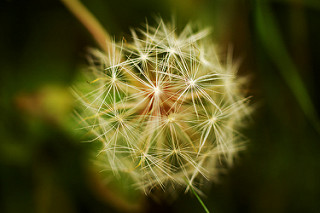

In [ ]:
test_image = ds['test'][-1]['image']
test_image

In [ ]:
import torch
from transformers import AutoModelForImageClassification, AutoFeatureExtractor

model_id = f'jonathanfernandes/vit-base-patch16-224-finetuned-flower'

def classify_image(image):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
  inp = feature_extractor(image, return_tensors='pt').to(device)
  outp = model(**inp)
  pred = torch.argmax(outp.logits, dim=-1).item()
  return model.config.id2label[pred]

classify_image(test_image)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/839 [00:00<?, ?B/s]

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/config.json
Model config ViTConfig {
  "_name_or_path": "jonathanfernandes/vit-base-patch16-224-finetuned-flower",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "daisy",
    "1": "dandelion",
    "2": "roses",
    "3": "sunflowers",
    "4": "tulips"
  },
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "daisy": 0,
    "dandelion": 1,
    "roses": 2,
    "sunflowers": 3,
    "tulips": 4
  },
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "problem_type": "single_label_cl

pytorch_model.bin:   0%|          | 0.00/343M [00:00<?, ?B/s]

loading weights file pytorch_model.bin from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/pytorch_model.bin
/usr/local/lib/python3.11/dist-packages/transformers/modeling_utils.py:399: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_onl

preprocessor_config.json:   0%|          | 0.00/228 [00:00<?, ?B/s]

loading configuration file preprocessor_config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/preprocessor_config.json
Feature extractor ViTFeatureExtractor {
  "do_normalize": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "size": 224
}



'dandelion'

In [ ]:
import torch

model_id = f'jonathanfernandes/vit-base-patch16-224-finetuned-flower'

def classify_image(image):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  model = AutoModelForImageClassification.from_pretrained(model_id).to(device)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
  inp = feature_extractor(image, return_tensors='pt').to(device)
  outp = model(**inp)
  pred = torch.nn.functional.softmax(outp.logits, dim=-1)
  preds = pred[0].cpu().detach().numpy()
  confidence = {label: float(preds[i]) for i, label in enumerate(labels)}
  return confidence

classify_image(test_image)

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/config.json
Model config ViTConfig {
  "_name_or_path": "jonathanfernandes/vit-base-patch16-224-finetuned-flower",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "daisy",
    "1": "dandelion",
    "2": "roses",
    "3": "sunflowers",
    "4": "tulips"
  },
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "daisy": 0,
    "dandelion": 1,
    "roses": 2,
    "sunflowers": 3,
    "tulips": 4
  },
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "problem_type": "single_label_cl

{'daisy': 2.918419340858236e-05,
 'dandelion': 0.9999024868011475,
 'roses': 2.0448676878004335e-05,
 'sunflowers': 3.475406265351921e-05,
 'tulips': 1.3023020073887892e-05}

In [ ]:
from transformers import pipeline

model_id = f'jonathanfernandes/vit-base-patch16-224-finetuned-flower'
feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)

image_classifier = pipeline('image-classification', model=model_id, feature_extractor=feature_extractor, framework="pt")
image_classifier(test_image)

loading configuration file preprocessor_config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/preprocessor_config.json
Feature extractor ViTFeatureExtractor {
  "do_normalize": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "size": 224
}

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/config.json
Model config ViTConfig {
  "_name_or_path": "jonathanfernandes/vit-base-patch16-224-finetuned-flower",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden

[{'score': 0.9999024868011475, 'label': 'dandelion'},
 {'score': 3.475402991170995e-05, 'label': 'sunflowers'},
 {'score': 2.9184220693423413e-05, 'label': 'daisy'},
 {'score': 2.0448676878004335e-05, 'label': 'roses'},
 {'score': 1.3023033716308419e-05, 'label': 'tulips'}]

## Inference on your phone using Gradio

In [ ]:
!wget https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-1.jpeg
!wget https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-2.jpeg

--2025-01-30 11:55:14--  https://github.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/raw/main/flower-1.jpeg
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/main/flower-1.jpeg [following]
--2025-01-30 11:55:15--  https://raw.githubusercontent.com/jonfernandes/Advanced_AI_Transformers_for_Computer_Vision/main/flower-1.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 180993 (177K) [image/jpeg]
Saving to: ‘flower-1.jpeg’

flower-1.jpeg       100%[===================>] 176.75K  --.-KB/s    in 0.01s   

2025-01-30 11:55:15 

In [ ]:
!ls -l

total 447284
-rw-r--r-- 1 root   root    180993 Jan 30 11:55 flower-1.jpeg
-rw-r--r-- 1 root   root    182353 Jan 30 11:55 flower-2.jpeg
drwxr-x--- 7 270850 5000      4096 Feb 10  2016 flower_photos
-rw-r--r-- 1 root   root 228813984 Jan 30 11:39 flower_photos.tgz
-rw-r--r-- 1 root   root 228813984 Jan 30 11:39 flower_photos.tgz.1
drwxr-xr-x 5 root   root      4096 Jan 30 11:54 logs
drwxr-xr-x 1 root   root      4096 Jan 28 14:22 sample_data
drwxr-xr-x 2 root   root      4096 Jan 30 11:54 vit-base-patch16-224-finetuned-flower


In [ ]:
import torch
from transformers import AutoModelForImageClassification, AutoFeatureExtractor
import gradio as gr

model_id = f'jonathanfernandes/vit-base-patch16-224-finetuned-flower'
labels = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

def classify_image(image):
  model = AutoModelForImageClassification.from_pretrained(model_id)
  feature_extractor = AutoFeatureExtractor.from_pretrained(model_id)
  inp = feature_extractor(image, return_tensors='pt')
  outp = model(**inp)
  pred = torch.nn.functional.softmax(outp.logits, dim=-1)
  preds = pred[0].cpu().detach().numpy()
  confidence = {label: float(preds[i]) for i, label in enumerate(labels)}
  return confidence

interface = gr.Interface(fn=classify_image,
                         inputs='image',
                         examples=['flower-1.jpeg', 'flower-2.jpeg'],
                         outputs='label').launch(debug=True, share=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
IMPORTANT: You are using gradio version 3.45.0, however version 4.44.1 is available, please upgrade.
--------
Running on public URL: https://ce5a3cd586ac3e9ae9.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--jonathanfernandes--vit-base-patch16-224-finetuned-flower/snapshots/b75a802c711e01f6789c394a1448ebdd63522dcf/config.json
Model config ViTConfig {
  "_name_or_path": "jonathanfernandes/vit-base-patch16-224-finetuned-flower",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "daisy",
    "1": "dandelion",
    "2": "roses",
    "3": "sunflowers",
    "4": "tulips"
  },
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "labe

Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://ce5a3cd586ac3e9ae9.gradio.live
